### Аугментации сложными шумами
В качестве сэмлов выбрано две записи, одна короче чем аугментации из набора esc50, другая длиннее, чтобы узнать как обрабатываются такие случаи.

используемый датасет с двумя сэмплами по ссылке  https://kaggle.com/datasets/89e00569aa9c0f49721f0465c88d98f49f003e10869d3e4a6effb917e4248f1d

датасет с аугментациями esc50 по ссылке https://kaggle.com/datasets/e5d8e2a2444e836bef8161e24be166623349d381b53a004e48076b676b7c72ba

датасет для аугментации разговором на заднем плане https://kaggle.com/datasets/3f172da82a4d446227bd7ee07ad45233a4f264d44f2def5cdd52239f8ebedef8

In [32]:
!pip install audiomentations

In [33]:
from audiomentations import AddBackgroundNoise, PolarityInversion
import librosa
import torch
import torchaudio
import numpy as np
import matplotlib.pyplot as plt

from IPython import display

In [34]:
def visualize_audio(wav: torch.Tensor, sr: int = 16000):
    # Average all channels
    if wav.dim() == 2:
        # Any to mono audio convertion
        wav = wav.mean(dim=0)
    
    plt.figure(figsize=(20, 5))
    plt.plot(wav, alpha=.7, c='green')
    plt.grid()
    plt.xlabel('Time', size=20)
    plt.ylabel('Amplitude', size=20)
    plt.show()
    
    display.display(display.Audio(wav, rate=sr))

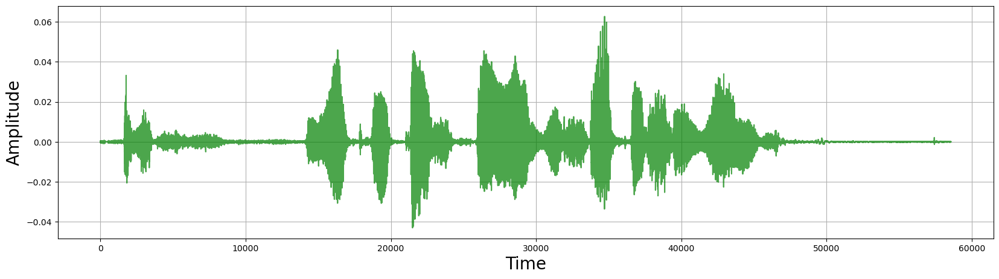

In [35]:
short, sr = librosa.load(f"/kaggle/input/testing-augmentations/0000bb8e1f6142c484850fbeaf10739e.wav", sr=None, mono=True)
visualize_audio(torch.tensor(short))

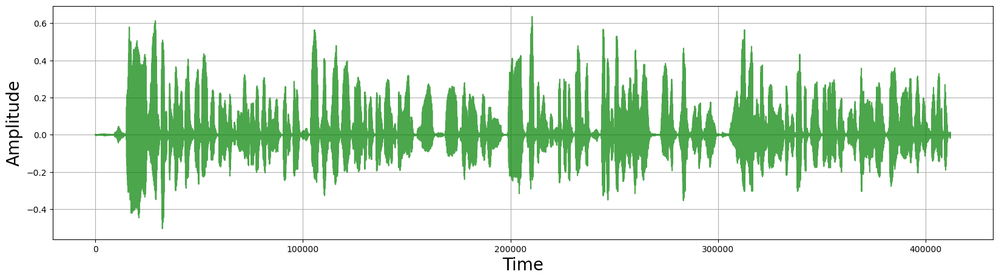

In [36]:
long, sr = librosa.load(f"/kaggle/input/testing-augmentations/ajdofpyqqjrdmrkeknum.wav", sr=None, mono=True)
visualize_audio(torch.tensor(long))

### Аугментация 'шумами окружающей среды'

При обучении я использую следующую функцию. Проверим на обоих семплах с максимальной и с минимальной громкостью.

Громкость определяется границами параматера snr_in_db (sound noise rate)(чем меньше, тем шума больше).

Параметр выбирается между граничными значениями с помощью равномерного распределения.

Исходное аудио остается той же длины. Аугментация зацикливается или отсекается по длине.

По умолчанию границы заданы равными 3 и 30. Я оставил их без изменений. Кажется, они достаточно адекватные. 

In [37]:
transform = AddBackgroundNoise(
    sounds_path="/kaggle/input/esc50-noises-test/1-38559-A-14.wav",
    min_snr_in_db=3.0,
    max_snr_in_db=30.0,
    noise_transform=PolarityInversion(),
    p=1.0
)

In [38]:
# с минимальным nsr
transform = AddBackgroundNoise(
    sounds_path="/kaggle/input/esc50-noises-test/1-38559-A-14.wav",
    min_snr_in_db=3.0,
    max_snr_in_db=3.0,
    noise_transform=PolarityInversion(),
    p=1.0
)

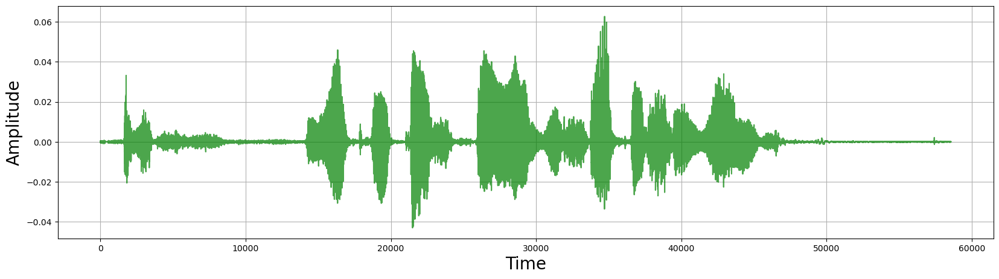

None



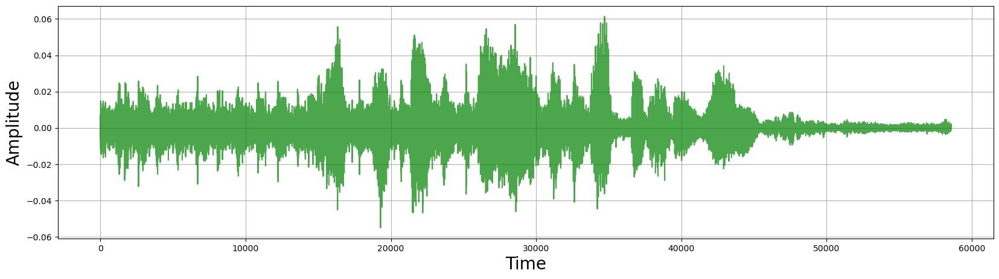

None


In [39]:
augmented_short = transform(short, sample_rate=16000)
print(visualize_audio(torch.tensor(short)))
print()
print(visualize_audio(torch.tensor(augmented_short)))

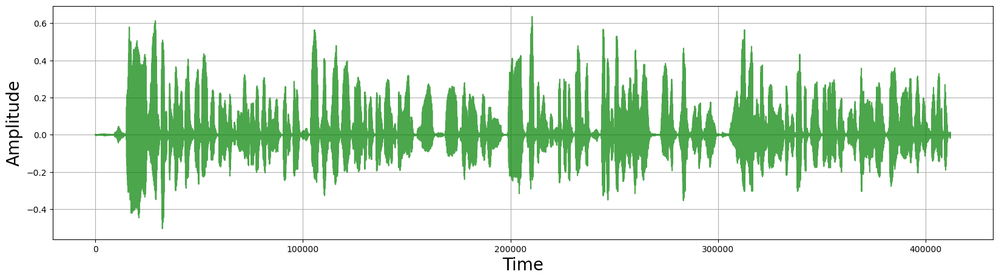

None



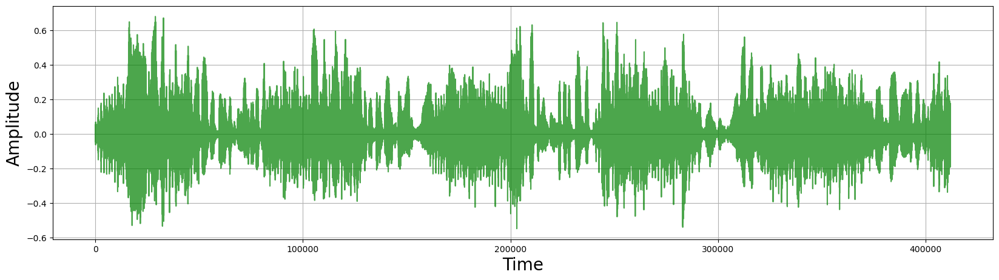

None


In [40]:
augmented_long = transform(long, sample_rate=16000)
print(visualize_audio(torch.tensor(long)))
print()
print(visualize_audio(torch.tensor(augmented_long)))

In [41]:
# с максимальнм nsr
transform = AddBackgroundNoise(
    sounds_path="/kaggle/input/esc50-noises-test/1-38559-A-14.wav",
    min_snr_in_db=30.0,
    max_snr_in_db=30.0,
    noise_transform=PolarityInversion(),
    p=1.0
)

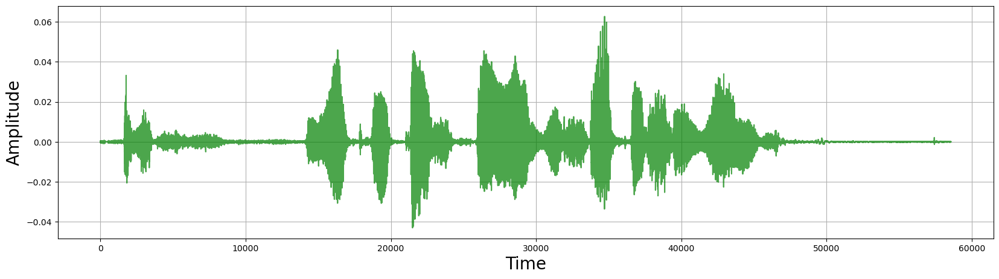

None



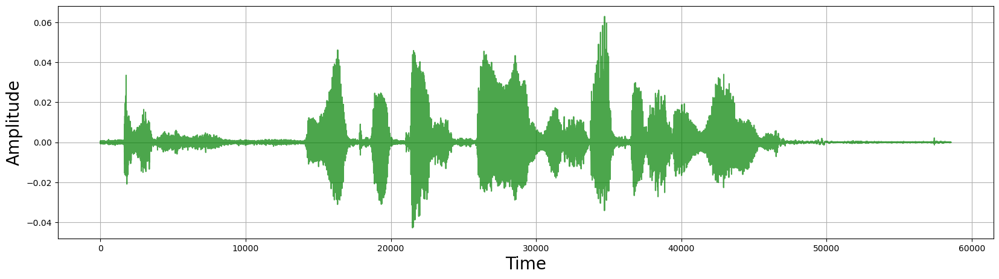

None


In [42]:
augmented_short = transform(short, sample_rate=16000)
print(visualize_audio(torch.tensor(short)))
print()
print(visualize_audio(torch.tensor(augmented_short)))

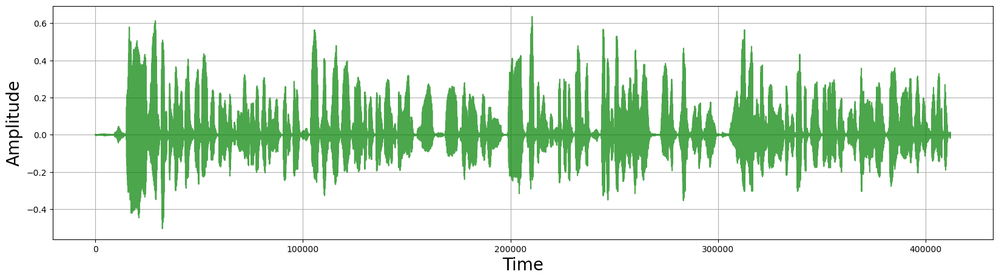

None



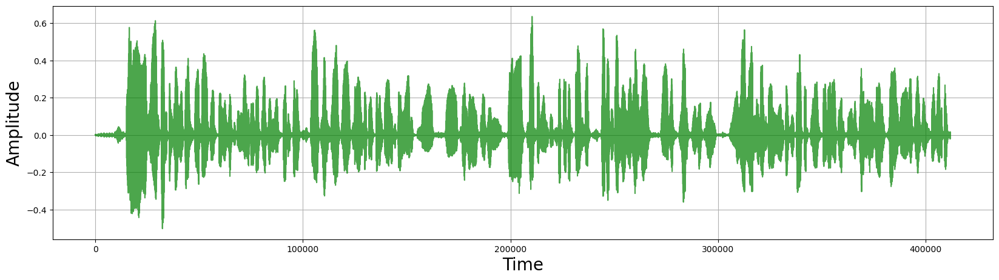

None


In [43]:
augmented_long = transform(long, sample_rate=16000)
print(visualize_audio(torch.tensor(long)))
print()
print(visualize_audio(torch.tensor(augmented_long)))

### Аугментация разговором

Речь включаться значительно тише, чем звуки окружающей среды

In [49]:
transform = AddBackgroundNoise(
    sounds_path="/kaggle/input/golos-crowd-test/test/crowd/files",
    min_snr_in_db=15.0,
    max_snr_in_db=15.0,
    noise_transform=PolarityInversion(),
    p=1.0
)

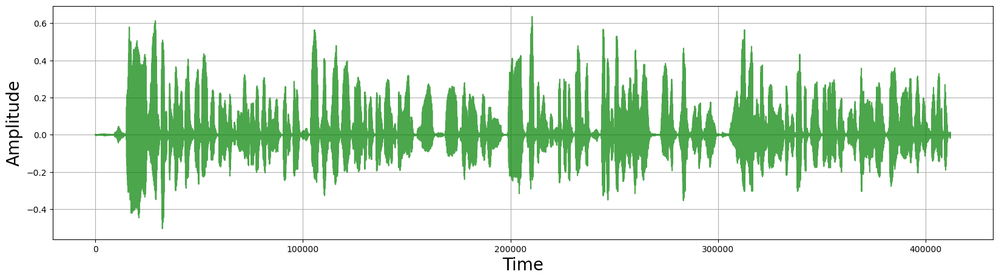

None



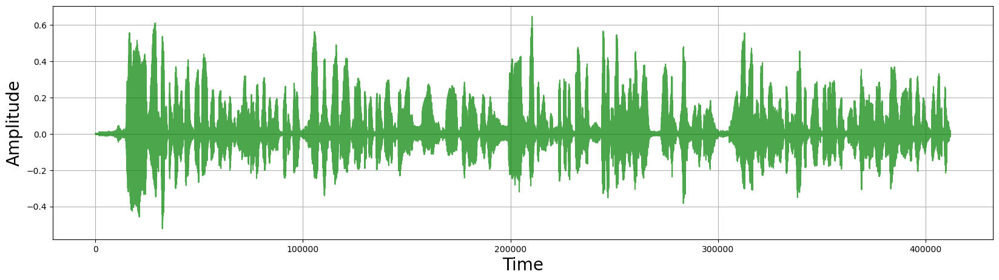

None


In [50]:
augmented_long = transform(long, sample_rate=16000)
print(visualize_audio(torch.tensor(long)))
print()
print(visualize_audio(torch.tensor(augmented_long)))

In [53]:
transform = AddBackgroundNoise(
    sounds_path="/kaggle/input/golos-crowd-test/test/crowd/files",
    min_snr_in_db=45.0,
    max_snr_in_db=45.0,
    noise_transform=PolarityInversion(),
    p=1.0
)

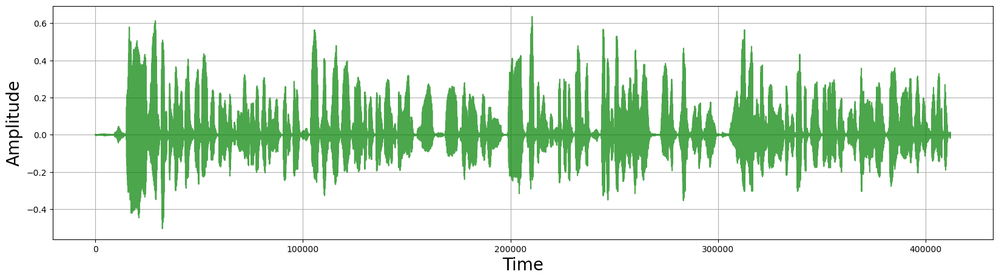

None



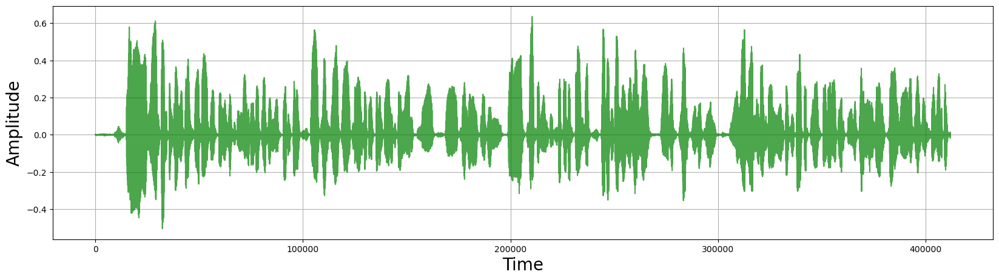

None


In [54]:
augmented_long = transform(long, sample_rate=16000)
print(visualize_audio(torch.tensor(long)))
print()
print(visualize_audio(torch.tensor(augmented_long)))